In [1]:
import pandas as pd

In [2]:
central = pd.read_csv('energyConsumption/central_city.csv')
gotham = pd.read_csv('energyConsumption/gotham_city.csv')
nanda = pd.read_csv('energyConsumption/nanda_parbat.csv')

In [10]:
print(len(central))
print(central.Datetime[-1:])
central.head(5)

45334
45333    2018-01-02 00:00:00
Name: Datetime, dtype: object


,Datetime,central_city_MW
0,2013-12-31 01:00:00,1868.0
1,2013-12-31 02:00:00,1842.0
2,2013-12-31 03:00:00,1848.0
3,2013-12-31 04:00:00,1879.0
4,2013-12-31 05:00:00,1941.0


In [11]:
print(len(gotham))
print(gotham.Datetime[-1:])
gotham.head(5)

116189
116188    2018-01-02 00:00:00
Name: Datetime, dtype: object


,Datetime,gotham_city_MW
0,2005-12-31 01:00:00,9399.0
1,2005-12-31 02:00:00,9080.0
2,2005-12-31 03:00:00,9011.0
3,2005-12-31 04:00:00,9052.0
4,2005-12-31 05:00:00,9142.0


In [12]:
print(len(nanda))
print(nanda.Datetime[-1:])
nanda.head(5)

66497
66496    2018-01-02 00:00:00
Name: Datetime, dtype: object


,Datetime,nanda_parbat_MW
0,2011-12-31 01:00:00,9980.0
1,2011-12-31 02:00:00,9438.0
2,2011-12-31 03:00:00,9069.0
3,2011-12-31 04:00:00,8827.0
4,2011-12-31 05:00:00,8753.0


A few notes:
1. Is city-wise consumption independent of each other? (this will determine if we're predicting using single or multiple time series or some other methods)
2. All data ends 2018-01-02

# let's visualise first

In [14]:
import matplotlib.pyplot as plt

In [23]:
#sorting by datetime
central.sort_values('Datetime', inplace=True)
gotham.sort_values('Datetime', inplace=True)
nanda.sort_values('Datetime', inplace=True)

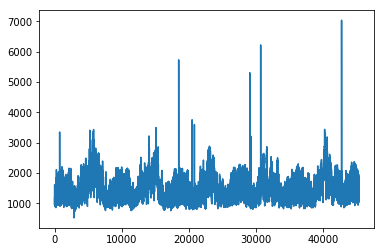

In [24]:
plt.plot(range(len(central)), central.central_city_MW)

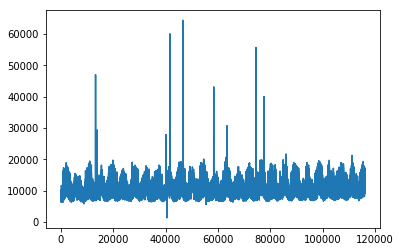

In [26]:
plt.plot(range(len(gotham)), gotham.gotham_city_MW)

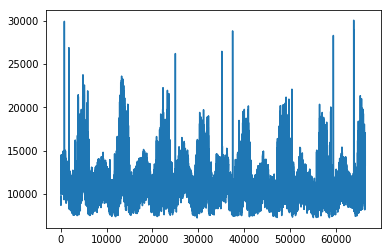

In [27]:
plt.plot(range(len(nanda)), nanda.nanda_parbat_MW)

There is seasonality, and the lengths are not the same, let's see if we can align them and produce parallel plots
We have the least data for central city so we'll use central city as a benchmark

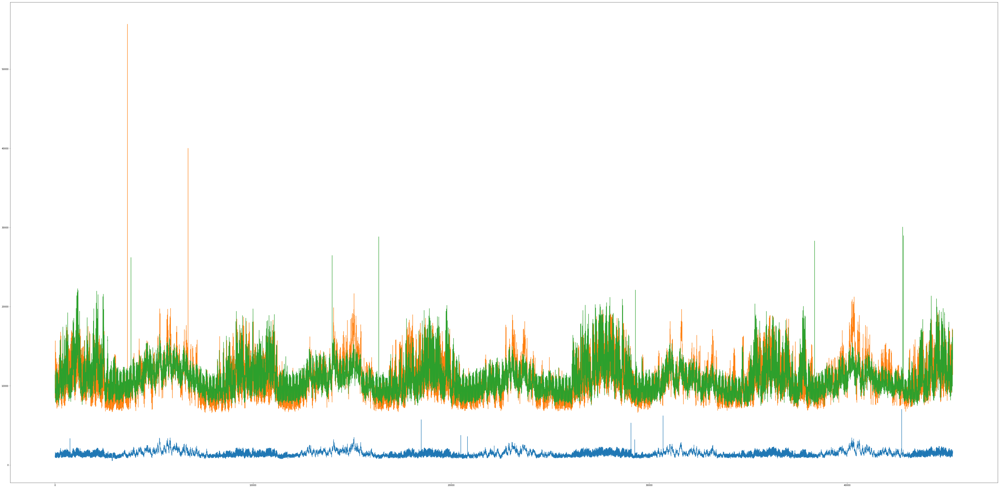

In [48]:
plt.figure(figsize=(80,40))
plt.plot(range(len(central)), central.central_city_MW)
plt.plot(range(len(central)), gotham[-len(central):].gotham_city_MW)
plt.plot(range(len(central)), nanda[-len(central):].nanda_parbat_MW)
plt.show()

Globally, central and gotham are strongly corelated, can't really tell about nanda.

We may wish to plot this section by section to see if we can get anything more precise out of this

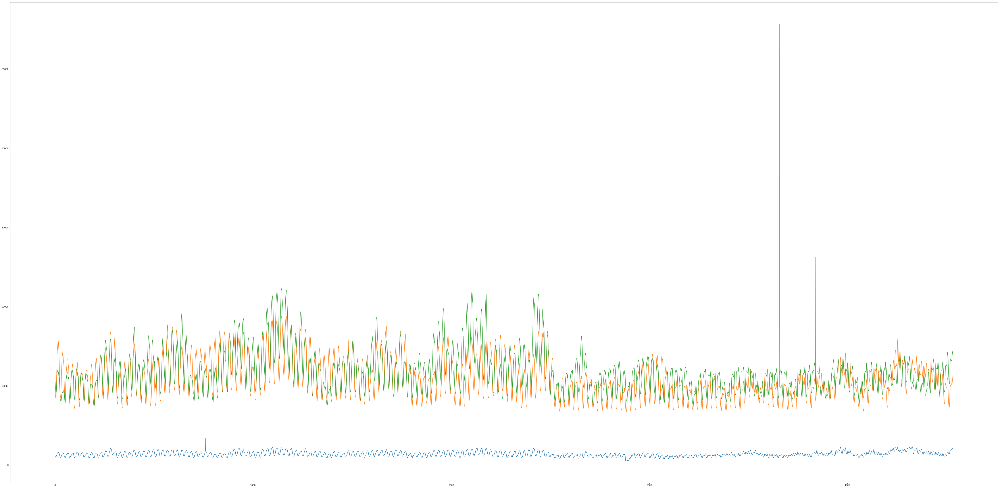

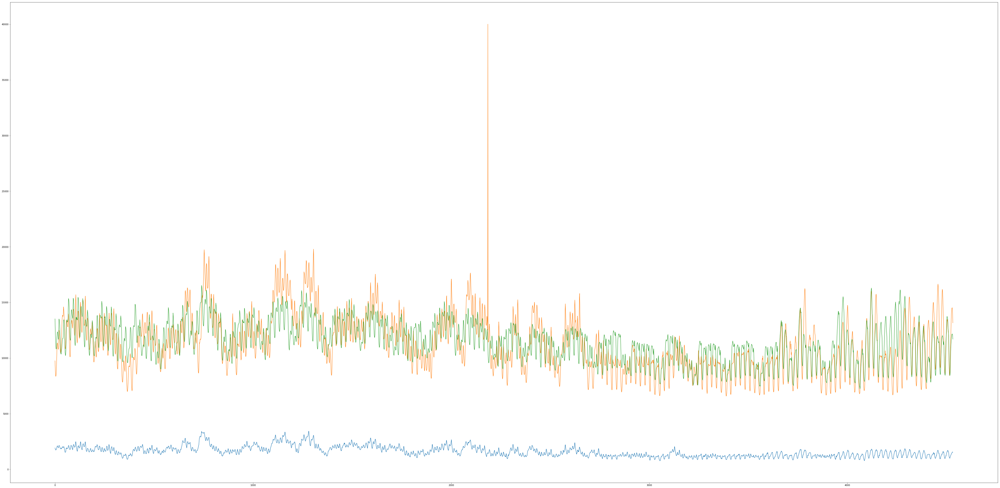

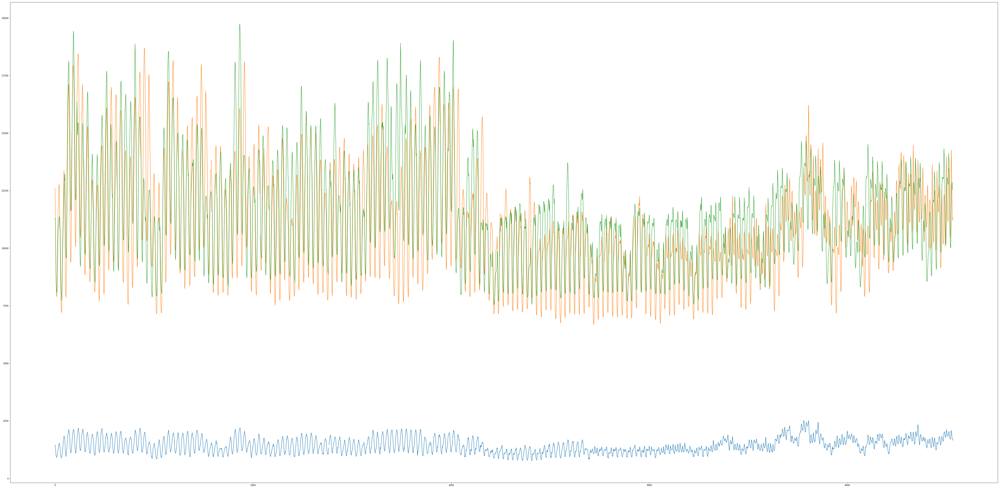

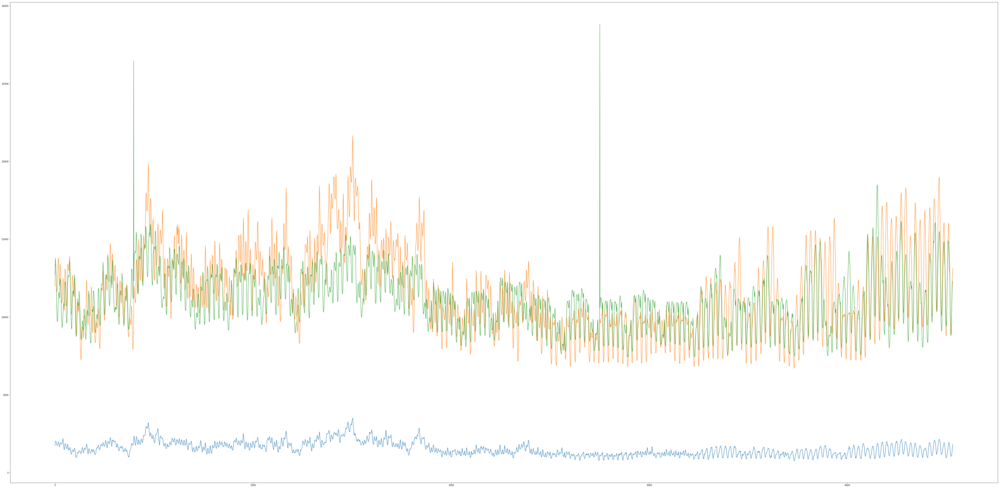

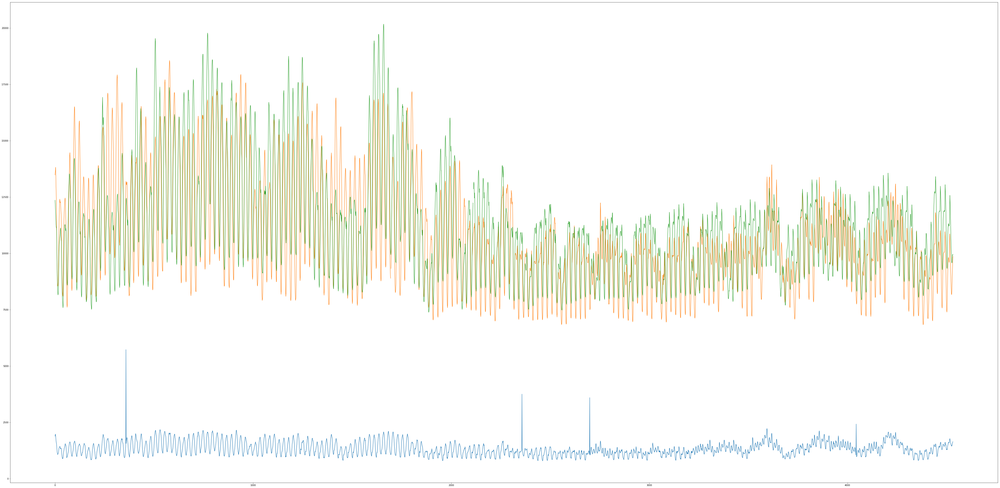

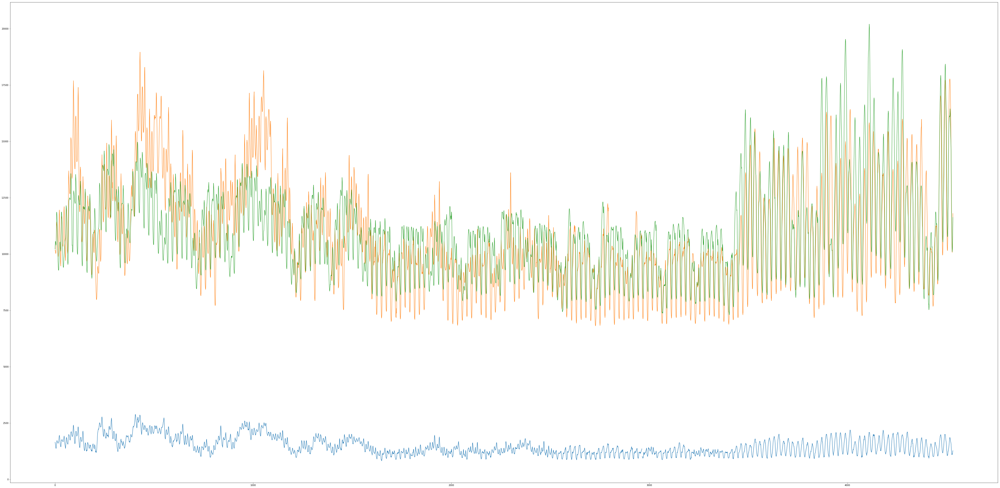

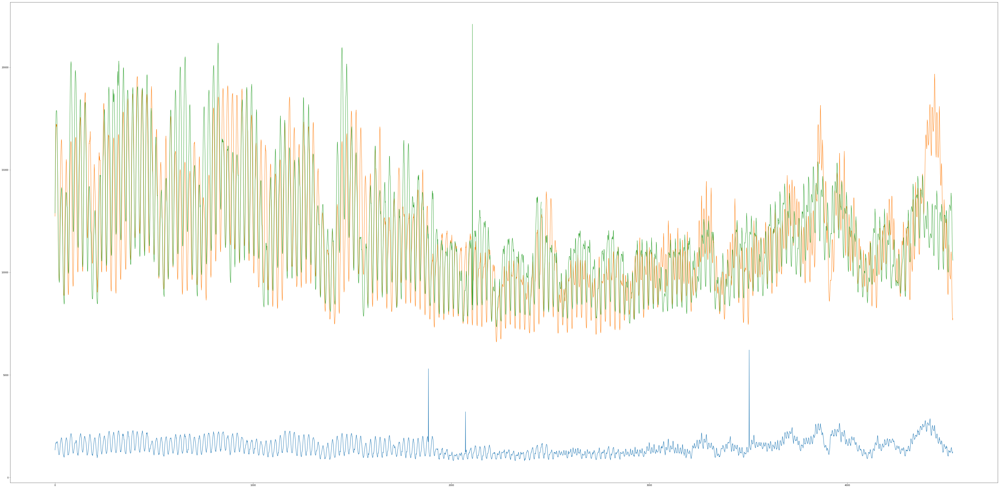

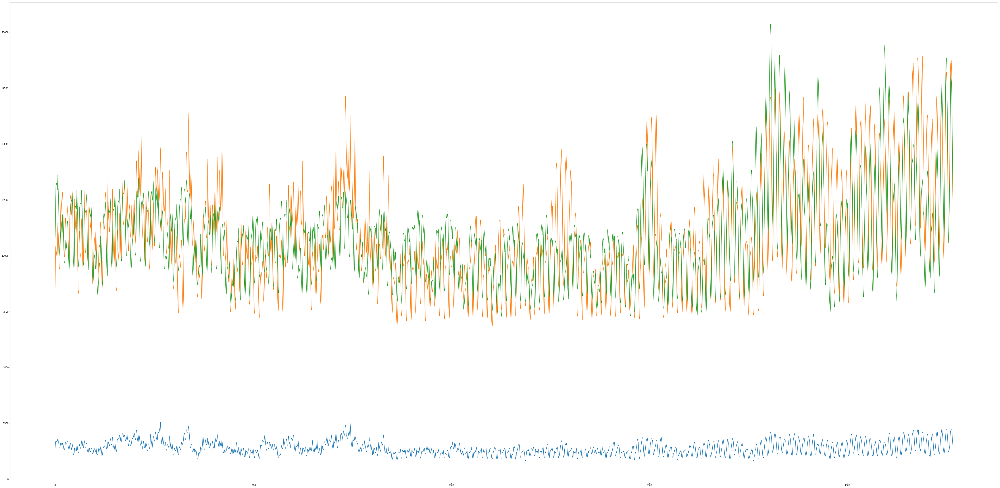

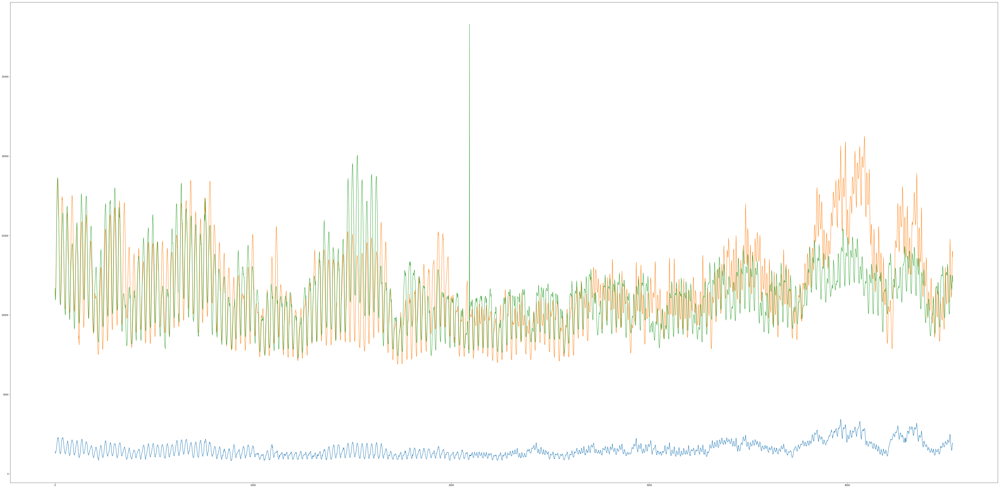

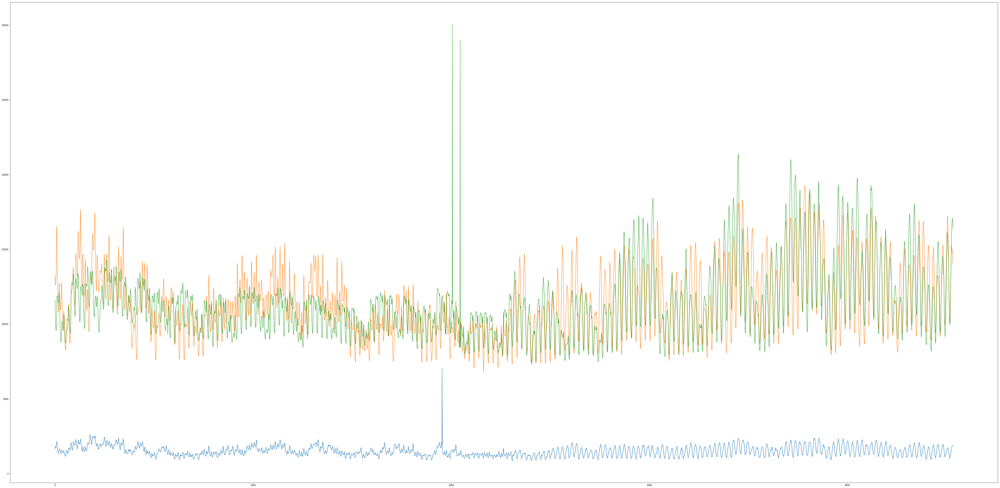

In [50]:
for i in range(10):
    sec_len = int(len(central)/10)
    plt.figure(figsize=(80,40))
    plt.plot(range(sec_len), central.central_city_MW[i*sec_len:(i+1)*sec_len])
    plt.plot(range(sec_len), gotham[-len(central):].gotham_city_MW[i*sec_len:(i+1)*sec_len])
    plt.plot(range(sec_len), nanda[-len(central):].nanda_parbat_MW[i*sec_len:(i+1)*sec_len])
    plt.savefig('plot_'+str(i))